In [1]:
import numpy as np
from numba import njit
from functools import partial

import talib 
import pandas as pd
import vectorbt as vbt
import vectorbt as vbt
from vectorbt.utils.colors import adjust_opacity
from vectorbt.utils.enum_ import map_enum_fields
from vectorbt.base.reshape_fns import broadcast, flex_select_auto_nb, to_2d_array
from vectorbt.portfolio.enums import SizeType, Direction, NoOrder, OrderStatus, OrderSide
from vectorbt.portfolio import nb

import sys
import os
function_essential_path = r"C:\Users\Jordi\Desktop\Environement de developement\Trading_Dev_Stratégie_Environement\FunctionEssential"
function_s_score_path = r'C:\Users\Jordi\Desktop\Environement de developement\Trading_Dev_Stratégie_Environement\Indicateur'
sys.path.append(function_essential_path)
sys.path.append(function_s_score_path)
import utils as us
import s_score as score

In [117]:

def entries_trades(close,high,low, s_score_ajusted,seuil,timeperiod,seuil_adx):
    entries_long = [False] * len(close)
    entries_short = [False] * len(close)
    # close = close.flatten()
    # high = high.flatten()
    # low = low.flatten()
    adx = talib.ADX(high, low, close, timeperiod)
    # adx = pd.Series(adx.flatten()) 
    # s_score_ajusted = pd.Series(s_score_ajusted.flatten()) 
    for i in range(len(close)):

        if s_score_ajusted[i] >= seuil:
            for j in range(i, len(close) - 1):
                if s_score_ajusted[j] > s_score_ajusted[j + 1]:
                    if (adx.iloc[j+1] > seuil_adx):
                        break
                    else:
                        entries_short[j+1] = True
                        break

        if s_score_ajusted[i] <= -1 * seuil:
            for j in range(i, len(close) - 1):
                if s_score_ajusted[j] < s_score_ajusted[j + 1]:
                    if (adx.iloc[j+1] > seuil_adx):
                        break
                    else:
                        entries_long[j+1] = True
                        break

    return entries_long, entries_short



In [118]:

Entry = vbt.IndicatorFactory(
    class_name="entries_trades",
    input_names=["close","high","low", "s_score_ajusted"],
    param_names=["seui","timeperiod", "seuil_adx"],
    output_names=["entries_long", "entries_short"],
).from_apply_func(entries_trades)


In [ ]:
##CLASS STRATEGIE##

@njit
def pre_sim_func_nb(c):
    entry_price = np.full(c.target_shape[1], np.nan, dtype=np.float64)  
    return (entry_price,)

@njit
def order_func_nb(c, entry_price, long, short, stop_loss, take_profit, size):
    price_now = nb.get_elem_nb(c, c.close)
    # entry_long_now = long[c.i, c.col]
    # entry_short_now = short[c.i, c.col]
    entry_long_now = nb.get_elem_nb(c, long)
    entry_short_now = nb.get_elem_nb(c, short)


    if entry_long_now:
        if c.position_now == 0:
            return nb.order_nb(
                size[c.col], 
                price=price_now,
                direction=Direction.LongOnly,
                fees=0.001
            )
        elif c.position_now < 0:
            return nb.order_nb(
                -size[c.col],  
                price=price_now,
                direction=Direction.ShortOnly,
                fees=0.0005
            )  

    if entry_short_now:
        if c.position_now == 0:
            return nb.order_nb(
                size[c.col], 
                price=price_now,
                direction=Direction.ShortOnly,
                fees=0.001
            )
        elif c.position_now > 0:
            return nb.order_nb(
                -size[c.col],  
                price=price_now,
                direction=Direction.LongOnly,
                fees=0.0005
            )

    if c.position_now > 0:
        SL = entry_price[c.col] * (1 - stop_loss[c.col])
        TP = entry_price[c.col] * (1 + take_profit[c.col])
        
        if price_now >= TP:
            return nb.order_nb(
                -size[c.col],
                price=TP,
                direction=Direction.LongOnly,
                fees=0.0005
            )
        elif price_now <= SL:
            return nb.order_nb(
                -size[c.col],
                price=SL,
                direction=Direction.LongOnly,
                fees=0.0005
            )

    if c.position_now < 0:
        SL = entry_price[c.col] * (1 + stop_loss[c.col])
        TP = entry_price[c.col] * (1 - take_profit[c.col])
        
        if price_now >= SL:
            return nb.order_nb(
                -size[c.col],
                price=SL,
                direction=Direction.ShortOnly,
                fees=0.0005
            )
        elif price_now <= TP:
            return nb.order_nb(
                -size[c.col],
                price=TP,
                direction=Direction.ShortOnly,
                fees=0.0005
            )

    return NoOrder

@njit
def post_order_func_nb(c, entry_price):
    if c.order_result.status == OrderStatus.Filled:
        entry_price[c.col] = c.order_result.price

class Strategie():


    def __init__(self,data,tickers,frequence_exec,frequence,multitimeframe):
        self.data = data
        self.tickers = tickers
        self.frequence_exec = frequence_exec
        self.frequences = frequence
        self.multitimeframe = multitimeframe   ## Si 0 pas de multitimeframe si 1 multitimeframe

    def backtest(self,sscore):
        entries_long_df = pd.DataFrame()
        entries_short_df = pd.DataFrame()
        exits_long_df = pd.DataFrame()
        exits_short_df = pd.DataFrame()
        close_df = pd.DataFrame()
        datetime_df = pd.DataFrame()

        for ticker in self.tickers:
            data = self.data[ticker]
            datetime = data.reset_index()['Datetime']
            s_score_ajuster = sscore[ticker]['adjusted_s_scores_vol']


            long,short = entries_trades(data['close'],data['high'],data['low'],s_score_ajuster,3,50,20)
            
            long = pd.Series(long, index=data['close'].index)
            short = pd.Series(short, index=data['close'].index)

            us.print_trades(0,long,short,None,None,data)
           
            long = long.reset_index(drop=True)
            short = short.reset_index(drop=True)
            close = data['close'].reset_index(drop=True)
            datetime = datetime.reset_index(drop=True)
            entries_long_df[ticker] = long
            entries_short_df[ticker] = short
            close_df[ticker] = close
            datetime_df[ticker] = datetime

        capital = 100000  
        risk_per_trade = 0.01  
        position_value = capital * risk_per_trade  
        size = np.array([(0.05 * capital) / (0.02 * close_df.iloc[0, i]) for i in range(len(self.tickers))])
        stop_loss = np.array([0.02] * len(self.tickers))  
        take_profit = np.array([0.04] * len(self.tickers))  


        portfolio = vbt.Portfolio.from_order_func(
            close_df,  
            order_func_nb,  
            entries_long_df.values,  
            entries_short_df.values,  
            stop_loss,  
            take_profit,  
            size,  
            freq=self.frequence_exec,  
            init_cash=100000,  # Ajout du capital initial
            pre_sim_func_nb=pre_sim_func_nb,  
            post_order_func_nb=post_order_func_nb,  
            broadcast_named_args=dict(  
                long=entries_long_df.values,  
                short=entries_short_df.values,  
                stop_loss=stop_loss,  
                take_profit=take_profit,  
                size=size  
            )
        )
        us.rapport_backtest(portfolio,close_df,datetime_df,self.tickers)
        return portfolio





    def optimize(self,close,high,low,s_score_ajuster,tp,sl,seuil_score,timeperiod,seuil_adx,choice):

        if choice == 1:
            list_portfolio = {}
            combinaison=[]

            for i in timeperiod:
                for j in seuil_adx:
                    combinaison.append((i,j))

            
            entries = Entry.run(close,high,low,s_score_ajuster,seuil_score,timeperiod,seuil_adx,param_product=True)

            long = entries.entries_long
            short = entries.entries_short
            long = long.reset_index(drop=True)
            short = short.reset_index(drop=True)
            close = close.reset_index(drop=True)



            close = pd.DataFrame(close)  
            close = close.iloc[:, :long.shape[1]]
            capital = 100000  

            
            size = np.array([(0.05 * capital) / (0.02 * close.iloc[0, i]) for i in range(close.shape[1])])
            size = np.array([size[0]] * long.shape[1])
            stop_loss = np.array([0.02] * long.shape[1])  
            take_profit = np.array([0.03] * long.shape[1])
            
            portfolio = vbt.Portfolio.from_order_func(
                close,  
                order_func_nb,
                long.values,  
                short.values,  
                stop_loss,  
                take_profit,  
                size,  
                freq=self.frequence_exec,
                init_cash=100000,
                pre_sim_func_nb=pre_sim_func_nb,
                post_order_func_nb=post_order_func_nb,
                broadcast_named_args=dict(
                    long=long.values,
                    short=short.values,
                    stop_loss=stop_loss,  
                    take_profit=take_profit,
                    size=size 
                )
            )
            perf = us.get_heatmap(portfolio,combinaison,2)

            param1,param2,metrics = us.get_best_param(perf)
            return param1,param2

        if choice ==2:
            list_portfolio = {}
            for ticker in self.tickers:
                combinaison=[]
                close = self.data[ticker]['close']
                high =  self.data[ticker]['high']
                low = self.data[ticker]['low']
                s_score_ajuster = sscore[ticker]['adjusted_s_scores_vol']

                entries = Entry.run(close,high,low,s_score_ajuster,seuil_score,timeperiod,seuil_adx,param_product=True)

                long = entries.entries_long
                short = entries.entries_short
                long = long.reset_index(drop=True)
                short = short.reset_index(drop=True)
                close = close.reset_index(drop=True)


                close = pd.DataFrame(close)  
                # close = close.iloc[:, :long.shape[1]]
                capital = 100000  

                
                size = np.array([(0.05 * capital) / (0.02 * close.iloc[0, i]) for i in range(close.shape[1])])
                
                stop_loss = []
                take_profit = []
                for i in tp:
                    for j in sl:
                        combinaison.append((i,j))
                        take_profit.append(i)
                        stop_loss.append(j)
                        
                  
                close = close.iloc[:, :len(stop_loss)]
                size = np.array([size[0]] * len(stop_loss))
                long = np.tile(long.values, (len(stop_loss), 1)).T
                short = np.tile(short.values, (len(stop_loss), 1)).T
                print(long.shape)


                print(len(stop_loss))
                portfolio = vbt.Portfolio.from_order_func(
                    close,  
                    order_func_nb,
                    long,  
                    short,  
                    stop_loss,  
                    take_profit,  
                    size,  
                    freq=self.frequence_exec,
                    init_cash=100000,
                    pre_sim_func_nb=pre_sim_func_nb,
                    post_order_func_nb=post_order_func_nb,
                    broadcast_named_args=dict(
                        long=long,
                        short=short,
                        stop_loss=stop_loss,  
                        take_profit=take_profit,
                        size=size 
                    )
                )
                list_portfolio[ticker] = portfolio
            
            perf = us.get_heatmap(list_portfolio,combinaison,self.tickers,2)
            param1,param2,metrics = us.get_best_param(perf)
            return param1,param2
        
        if choice == 3:
            list_portfolio = {}
            for ticker in self.tickers:
                combinaison=[]
                close = self.data[ticker]['close']
                high =  self.data[ticker]['high']
                low = self.data[ticker]['low']
                s_score_ajuster = sscore[ticker]['adjusted_s_scores_vol']
                for i in seuil_score:
                    for j in seuil_adx:
                        combinaison.append((i,j))

                entries = Entry.run(close,high,low,s_score_ajuster,seuil_score,timeperiod,seuil_adx,param_product=True)

                long = entries.entries_long
                short = entries.entries_short
                long = long.reset_index(drop=True)
                short = short.reset_index(drop=True)
                close = close.reset_index(drop=True)



                close = pd.DataFrame(close)  
                close = close.iloc[:, :long.shape[1]]
                capital = 100000  

                
                size = np.array([(0.05 * capital) / (0.02 * close.iloc[0, i]) for i in range(close.shape[1])])
                size = np.array([size[0]] * long.shape[1])
                stop_loss = np.array([0.02] * long.shape[1])  
                take_profit = np.array([0.03] * long.shape[1])
                
                

                print(long.shape[1])
                portfolio = vbt.Portfolio.from_order_func(
                    close,  
                    order_func_nb,
                    long.values,  
                    short.values,  
                    stop_loss,  
                    take_profit,  
                    size,  
                    freq=self.frequence_exec,
                    init_cash=100000,
                    pre_sim_func_nb=pre_sim_func_nb,
                    post_order_func_nb=post_order_func_nb,
                    broadcast_named_args=dict(
                        long=long.values,
                        short=short.values,
                        stop_loss=stop_loss,  
                        take_profit=take_profit,
                        size=size 
                    )
                )
                list_portfolio[ticker] = portfolio


            perf = us.get_heatmap(list_portfolio,combinaison,self.tickers,2)
            param1,param2,metrics = us.get_best_param(perf)
            return param1,param2
        

    def wfa(self, sscore, period_OOS, period_IOS, sl, tp, period_adx, seuil_adx):
        all_entries = pd.DataFrame()  
        close_df = pd.DataFrame()
        for ticker in self.tickers:
            data = self.data[ticker]
            cycle = us.generate_wf_cycles(data, period_IOS, period_OOS)
            s_score_ajuster = sscore[ticker]['adjusted_s_scores_vol']
            close = data['close']
            high = data['high']
            low = data['low']
            long_entries_index = []
            short_entries_index = []
            
            close_df[ticker] = close
            for i in range(len(cycle)):

                close_IOS = data["close"].iloc[cycle[i][0]:cycle[i][1]]
                close_OOS = data["close"].iloc[cycle[i][2]:cycle[i][3]]

                high_IOS = data["high"].iloc[cycle[i][0]:cycle[i][1]]
                high_OOS = data["high"].iloc[cycle[i][2]:cycle[i][3]]

                low_IOS = data["low"].iloc[cycle[i][0]:cycle[i][1]]
                low_OOS = data["low"].iloc[cycle[i][2]:cycle[i][3]]

                s_score_ajuster_IOS = s_score_ajuster.iloc[cycle[i][0]:cycle[i][1]].reset_index(drop=True)
                s_score_ajuster_OOS = s_score_ajuster.iloc[cycle[i][2]:cycle[i][3]].reset_index(drop=True)


                param1, param2 = self.optimize(close_IOS,high_IOS,low_IOS,s_score_ajuster_IOS,tp,sl,3,period_adx,seuil_adx,1)
                print(param1)
                print(param2)
                if i == 0:
                    entries = Entry.run(close_IOS, high_IOS, low_IOS, s_score_ajuster_IOS, 3, param1, param2)
                    long_entries_index.extend(entries.entries_long[entries.entries_long].index)
                    short_entries_index.extend(entries.entries_short[entries.entries_short].index)


                entries = Entry.run(close_OOS, high_OOS, low_OOS, s_score_ajuster_OOS, 3, param1, param2)
                long_entries_index.extend(entries.entries_long[entries.entries_long].index)
                short_entries_index.extend(entries.entries_short[entries.entries_short].index)

            entries_long = data["close"].copy()
            entries_long[:] = False 
            entries_long.loc[long_entries_index] = True  

            entries_short = data["close"].copy()
            entries_short[:] = False  
            entries_short.loc[short_entries_index] = True  


            capital = 100000  
            risk_per_trade = 0.01   


            capital = 100000  
            risk_per_trade = 0.01  
            position_value = capital * risk_per_trade  
            size = np.array([(0.05 * capital) / (0.02 * close_df.iloc[0, i]) for i in range(len(self.tickers))])
            stop_loss = np.array([0.01] * len(self.tickers))  
            take_profit = np.array([0.02] * len(self.tickers))

            entries_long = entries_long.to_frame() 
            entries_short = entries_short.to_frame() 

            entries_long = entries_long.reset_index(drop=True) 
            entries_short = entries_short.reset_index(drop=True)  

            entries_long.columns = [ticker] 
            entries_short.columns = [ticker]

            print(type(close_df))
            print(close_df.shape)
            print(type(entries_long))
            print(entries_long.shape)
            print(type(entries_short))
            print(entries_short.shape)
            print(type(size))
            print(size)
            print(type(stop_loss))
            print(stop_loss)
            print(type(take_profit))
            print(take_profit)

            print(entries_long.head())  # Affiche les 5 premières lignes
            print(entries_short.head())  # Pareil pour entries_short

            nbr_true_long = entries_long.sum().values[0]  # Somme des True dans entries_long
            nbr_true_short = entries_short.sum().values[0]  # Somme des True dans entries_short

            print(f"Nombre de True dans entries_long : {nbr_true_long}")
            print(f"Nombre de True dans entries_short : {nbr_true_short}")

            entries_long = entries_long.astype(bool)  # Convertir en booléen
            entries_short = entries_short.astype(bool)

            entries_long = entries_long.values  # Convertir en numpy array
            entries_short = entries_short.values



            portfolio = vbt.Portfolio.from_order_func(
                close_df,  
                order_func_nb,  
                entries_long,  
                entries_short,  
                stop_loss,  
                take_profit,  
                size,  
                freq=self.frequence_exec,  
                init_cash=100000,  # Ajout du capital initial
                pre_sim_func_nb=pre_sim_func_nb,  
                post_order_func_nb=post_order_func_nb,  
                broadcast_named_args=dict(  
                    long=entries_long,  
                    short=entries_short,  
                    stop_loss=stop_loss,  
                    take_profit=take_profit,  
                    size=size  
                )
            )
            us.get_pnl(portfolio)
            return portfolio










In [116]:
tickers = ['EURUSD','GPDUSD']
DATA = us.get_data_forex(tickers,'H4')
s_score_value = {}
for ticker in tickers:
    data_traitement = DATA[ticker]
    nb_nan = data_traitement['close'].isna().sum()
    close = data_traitement['close'].dropna()
    close_without_index = close.reset_index()
    result = score.mean_reversion(close, close_without_index['Datetime'], 85, "VOL", 0.5, "EGARCH")
    result_df = pd.DataFrame({
        's_score_value': result[0],
        'adjusted_s_scores_vol': result[1],
        'theta_vals': result[2],
        'mu_vals': result[3],
        'sigma_vals': result[4]
    })
    nan_rows = pd.DataFrame([[float('nan')] * result_df.shape[1]] * nb_nan, columns=result_df.columns)
    result_df = pd.concat([result_df, nan_rows], ignore_index=True)

    s_score_value[ticker] = result_df

Estimation des paramètres OU:   0%|          | 0/36224 [00:00<?, ?it/s]

  0%|          | 0/36224 [00:00<?, ?it/s]

C:\Users\Jordi\Desktop\Environement de developement\Trading_Dev_Stratégie_Environement\Indicateur\s_score.py:31: RuntimeWarning:

invalid value encountered in sqrt

c:\Users\Jordi\AppData\Local\Programs\Python\Python312\Lib\site-packages\arch\univariate\base.py:768: ConvergenceWarning:

The optimizer returned code 4. The message is:
Inequality constraints incompatible
See scipy.optimize.fmin_slsqp for code meaning.


Calcul de la volatilité conditionnelle: 100%|██████████| 36309/36309 [00:00<00:00, 311779.08it/s]


36308


C:\Users\Jordi\AppData\Local\Temp\ipykernel_8844\2063347736.py:18: FutureWarning:

The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.



  0%|          | 0/36224 [00:00<?, ?it/s]

Estimation des paramètres OU:   0%|          | 0/36224 [00:17<?, ?it/s]
C:\Users\Jordi\Desktop\Environement de developement\Trading_Dev_Stratégie_Environement\Indicateur\s_score.py:31: RuntimeWarning:

invalid value encountered in sqrt

Calcul de la volatilité conditionnelle:   0%|          | 0/36309 [00:00<?, ?it/s]c:\Users\Jordi\AppData\Local\Programs\Python\Python312\Lib\site-packages\arch\univariate\base.py:768: ConvergenceWarning:

The optimizer returned code 4. The message is:
Inequality constraints incompatible
See scipy.optimize.fmin_slsqp for code meaning.


Calcul de la volatilité conditionnelle: 100%|██████████| 36309/36309 [00:00<00:00, 235874.54it/s]


36308


C:\Users\Jordi\AppData\Local\Temp\ipykernel_8844\2063347736.py:18: FutureWarning:

The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.



c:\Users\Jordi\AppData\Local\Programs\Python\Python312\Lib\site-packages\vectorbt\base\indexing.py:145: FutureWarning:

Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`



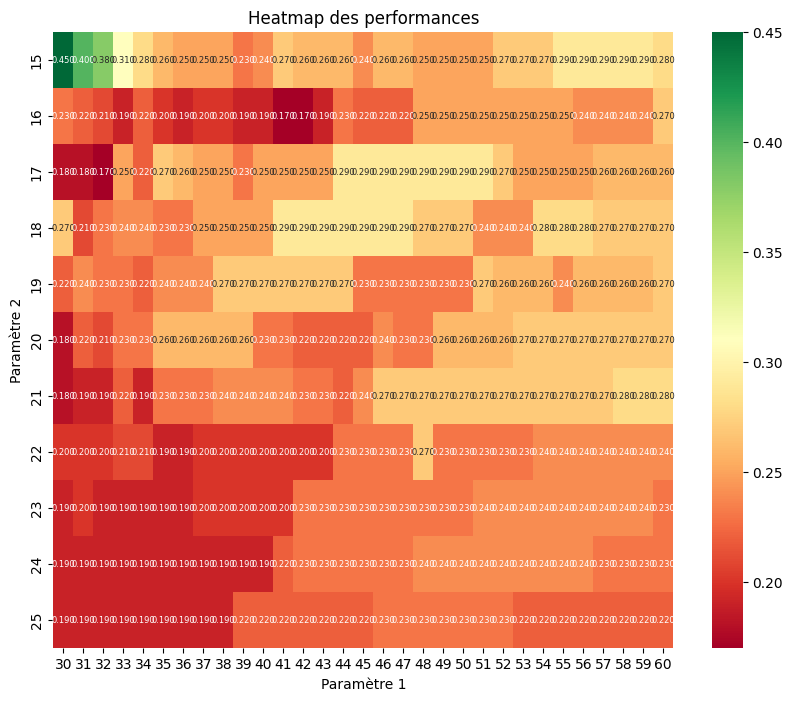

In [115]:
strat = Strategie(DATA,tickers,"240m","240m",0)
timeperiod = list(range(30, 61, 1))
seuil_adx = list(range(15, 26, 1))
close = DATA['EURUSD']['close']
high = DATA['EURUSD']['high']
low = DATA['EURUSD']['low']
s_score_ajuster = s_score_value['EURUSD']['adjusted_s_scores_vol']
tp = 0.03
sl = 0.02
param1, param2 = strat.optimize(close,high,low,s_score_ajuster,tp,sl,3,timeperiod,seuil_adx,1)
#strat.wfa(s_score_value,"2Y","10Y",sl,tp,timeperiod,seuil_adx)

In [119]:
strat = Strategie(DATA,tickers,"240m","240m",0)
strat.backtest(s_score_value)


---------------------------------------------------------------GLOBAL EQUITY CURVE---------------------------------------------------------------




------------------------------------------------------------------GLOBAL METRICS-----------------------------------------------------------------


------------------------------------------------------------------DETAILS : EURUSD-----------------------------------------------------------------

Total Return : 64.35%
Benchmark return : 6.48%
CAGR : 3.04%
Volatility : 12.55%
Sharpe Ratio : 0.3
Benchmark sharpe ratio : 0.04
Max Drawdown: -29.62%
Calmar Ratio : 0.1
Beta : -0.31


Total trades : 78
Total long trades 35
Total short trades 43
Win rate : 0.48%
Wining streak : 4.0
Loosing streak : 4.0
Average winning trade : 3.0%
Average losing trade : -2.0%
Profit factor : 1.35
Expectancy : 824.97%



 -> Average duration trades (jour) : 37.96




--------------------------------------------------------------------------------------------------------------------------------------------------


------------------------------------------------------------------DETAILS : GPDUSD-----------------------------------------------------------------

Total Return : -12.98%
Benchmark return : -19.78%
CAGR : -0.84%
Volatility : 11.36%
Sharpe Ratio : -0.02
Benchmark sharpe ratio : -0.02
Max Drawdown: -34.98%
Calmar Ratio : -0.02
Beta : -0.2


Total trades : 83
Total long trades 41
Total short trades 42
Win rate : 0.43%
Wining streak : 4.0
Loosing streak : 7.0
Average winning trade : 3.0%
Average losing trade : -2.0%
Profit factor : 0.93
Expectancy : -156.42%



 -> Average duration trades (jour) : 33.34




--------------------------------------------------------------------------------------------------------------------------------------------------

